In [83]:
import pathlib

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch
import tensorboard as tb

sparsity_list = [0, 0.2, 0.5, 0.8, 0.9]
arch_list = ["fpn", "manet", "deeplabv3", "unet", "linknet", "unet++"]
arch_name_dict = {
    "fpn":"FPN", 
    "manet":"MANet", 
    "deeplabv3":"Deeplabv3", 
    "unet":"UNet", 
    "linknet":"LinkNet", 
    "unet++":"UNet++"
}
arch_color_dict = {
    "fpn":"blue", 
    "manet":"red", 
    "deeplabv3":"green", 
    "unet":"orange", 
    "linknet":"purple", 
    "unet++":"brown"
}
encoder = "mobilenet_v2"
title = "exp_1"

dataset_list = ["NEA"]

full_title_list = [arch+"_"+encoder+"_"+dataset+"_"+title for arch in arch_list for dataset in dataset_list]
result_dir = pathlib.Path(".")/"results"

In [84]:
result_paths = []
for full_title in full_title_list:
    for sparsity in sparsity_list:
        result_path = result_dir/full_title/"result.csv"
        if sparsity >0: 
            result_path = result_dir/full_title/(f"result_{str(sparsity)}.csv")
        result_paths += [result_path]
print(result_paths)

[WindowsPath('results/fpn_mobilenet_v2_NEA_exp_1/result.csv'), WindowsPath('results/fpn_mobilenet_v2_NEA_exp_1/result_0.2.csv'), WindowsPath('results/fpn_mobilenet_v2_NEA_exp_1/result_0.5.csv'), WindowsPath('results/fpn_mobilenet_v2_NEA_exp_1/result_0.8.csv'), WindowsPath('results/fpn_mobilenet_v2_NEA_exp_1/result_0.9.csv'), WindowsPath('results/manet_mobilenet_v2_NEA_exp_1/result.csv'), WindowsPath('results/manet_mobilenet_v2_NEA_exp_1/result_0.2.csv'), WindowsPath('results/manet_mobilenet_v2_NEA_exp_1/result_0.5.csv'), WindowsPath('results/manet_mobilenet_v2_NEA_exp_1/result_0.8.csv'), WindowsPath('results/manet_mobilenet_v2_NEA_exp_1/result_0.9.csv'), WindowsPath('results/deeplabv3_mobilenet_v2_NEA_exp_1/result.csv'), WindowsPath('results/deeplabv3_mobilenet_v2_NEA_exp_1/result_0.2.csv'), WindowsPath('results/deeplabv3_mobilenet_v2_NEA_exp_1/result_0.5.csv'), WindowsPath('results/deeplabv3_mobilenet_v2_NEA_exp_1/result_0.8.csv'), WindowsPath('results/deeplabv3_mobilenet_v2_NEA_exp_1

In [85]:
results_df = [pd.read_csv(result_path.absolute()) for result_path in result_paths]
all_df = pd.concat(results_df)

<function xlabel at 0x000001A053C201F0>


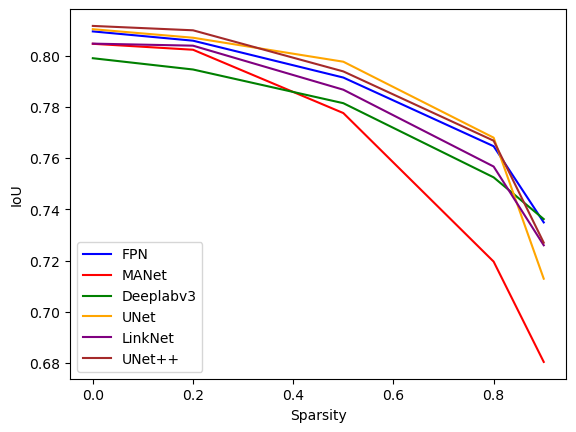

In [86]:
for arch in arch_list:
    arch_df = all_df[all_df["arch"]==arch]
    arch_name = arch_name_dict[arch]
    plt.plot(arch_df["sparsity"], arch_df["iou_score"], c=arch_color_dict[arch], label=arch_name)
print(plt.xlabel)
plt.xlabel("Sparsity")
plt.ylabel("IoU")
plt.legend()
plt.gcf()
plt.savefig("pruning-testing-score.jpg", dpi=200, bbox_inches='tight')
plt.show()

In [87]:
import traceback
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

def tflog2pandas(path):
    runlog_data = pd.DataFrame({"metric": [], "value": [], "step": []})
    try:
        event_acc = EventAccumulator(path)
        event_acc.Reload()
        tags = event_acc.Tags()["scalars"]
        for tag in tags:
            event_list = event_acc.Scalars(tag)
            values = list(map(lambda x: x.value, event_list))
            step = list(map(lambda x: x.step, event_list))
            r = {"metric": [tag] * len(step), "value": values, "step": step}
            r = pd.DataFrame(r)
            runlog_data = pd.concat([runlog_data, r])
    # Dirty catch of DataLossError
    except Exception:
        print("Event file possibly corrupt: {}".format(path))
        traceback.print_exc()
    return runlog_data

In [88]:
progress_df_dict = {}
for full_title in full_title_list:
    path=pathlib.Path(".")/"runs"/full_title/"iou_score_valid"
    df=tflog2pandas(path.absolute())
    progress_df_dict[full_title] = df

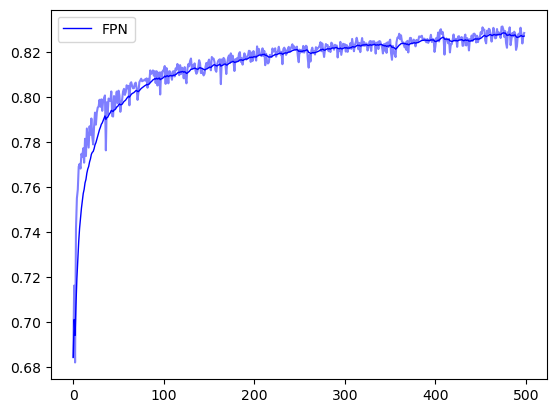

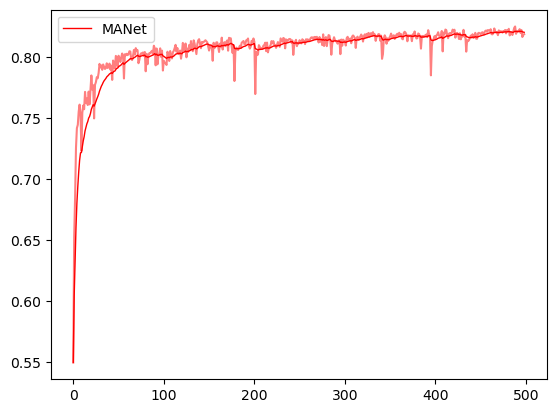

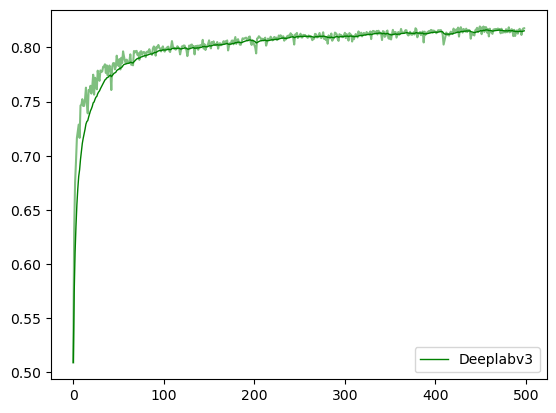

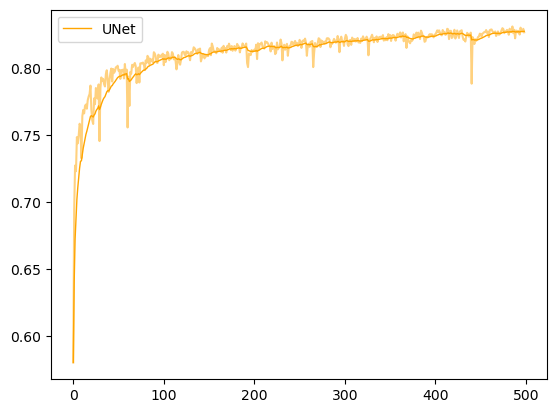

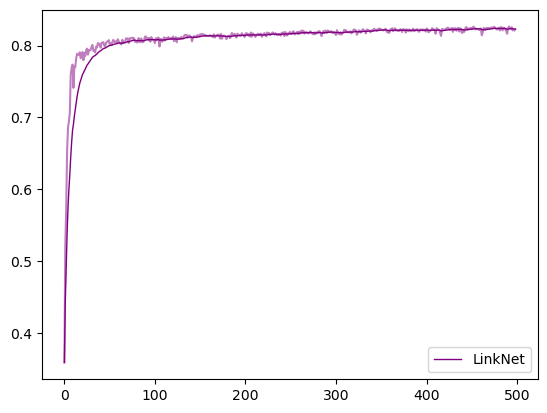

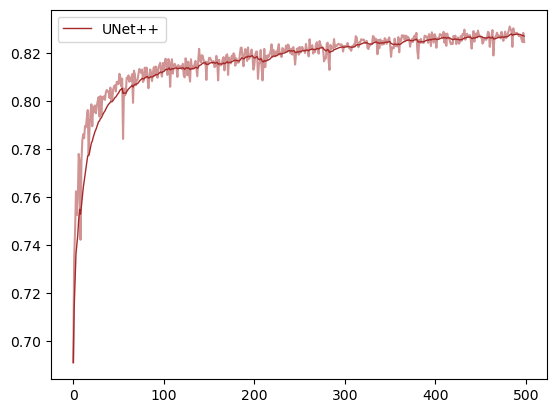

In [89]:
for title, progress_df in progress_df_dict.items():
    title_cmps = title.split("_")
    arch = title_cmps[0]
    arch_name = arch_name_dict[arch]
    color = arch_color_dict[arch]
    ax = plt.subplot()
    ax.plot(progress_df["value"].ewm(alpha=0.1).mean(), c=color, label=arch_name, linewidth=1)
    ax.plot(progress_df["value"], alpha=0.5, c=color)
    plt.legend()
    plt.gcf()
    plt.savefig(f"{arch}_training_progress", dpi=200, bbox_inches='tight')
    plt.show()

In [106]:
pruning_progress_df_dict = {}
for full_title in full_title_list:
    for sparsity in sparsity_list:
        pruned_title = (full_title+str(sparsity))
        if sparsity==0:
            continue
        path=pathlib.Path(".")/"runs"/pruned_title
        df=tflog2pandas(path.absolute())
        pruning_progress_df_dict[pruned_title] = df
print(pruning_progress_df_dict[pruned_title])

       metric     value  step
0   iou_score  0.830509   0.0
1   iou_score  0.827792   1.0
2   iou_score  0.829497   2.0
3   iou_score  0.829131   3.0
4   iou_score  0.824219   4.0
..        ...       ...   ...
95   sparsity  0.878111  95.0
96   sparsity  0.878111  96.0
97   sparsity  0.878111  97.0
98   sparsity  0.878111  98.0
99   sparsity  0.878111  99.0

[600 rows x 3 columns]


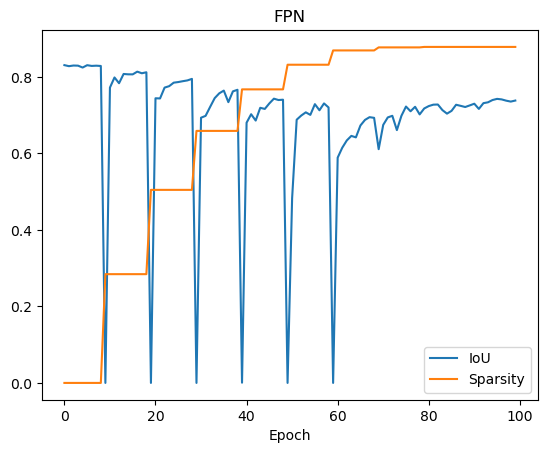

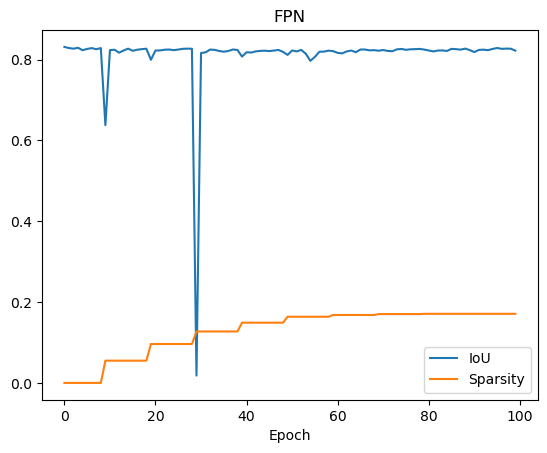

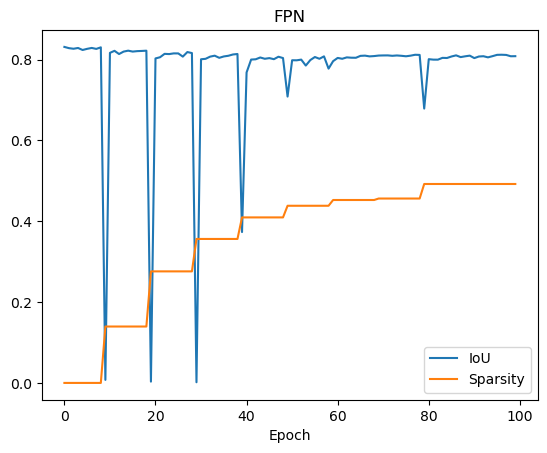

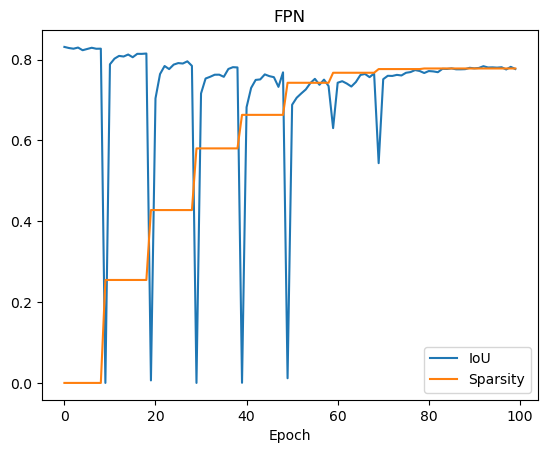

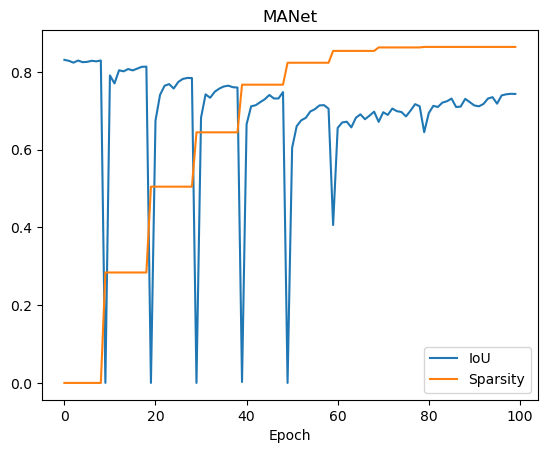

...

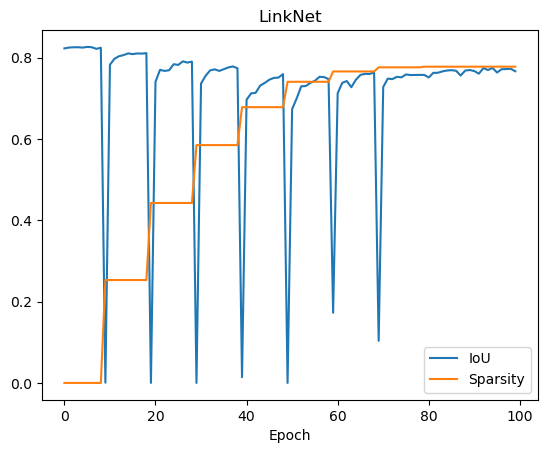

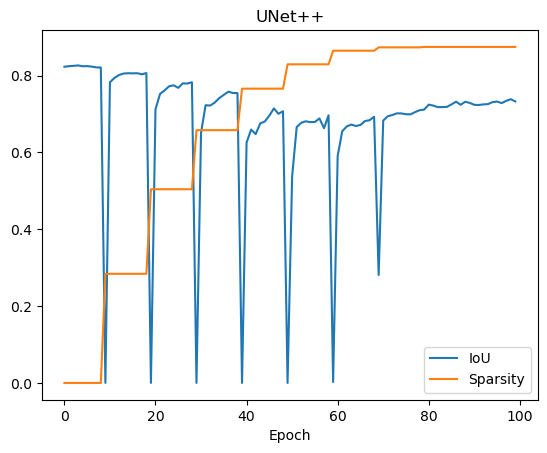

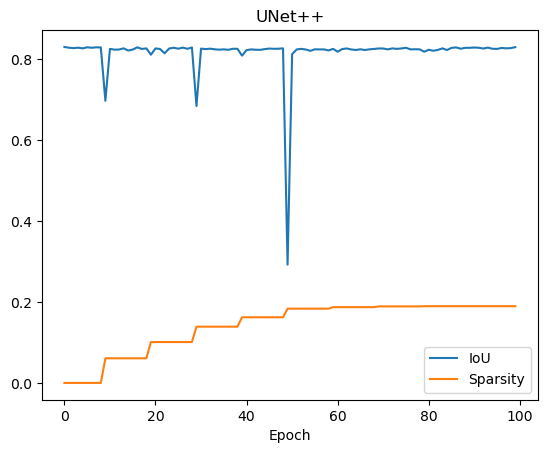

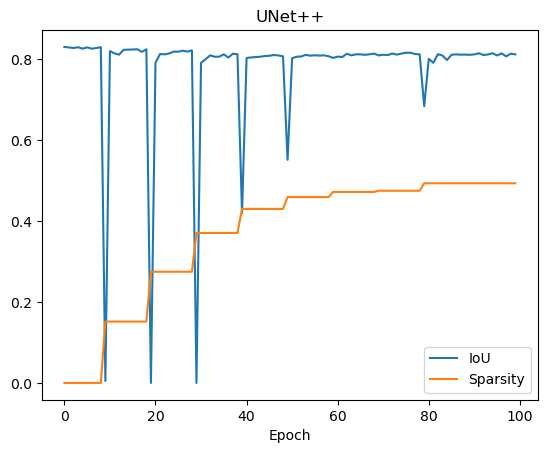

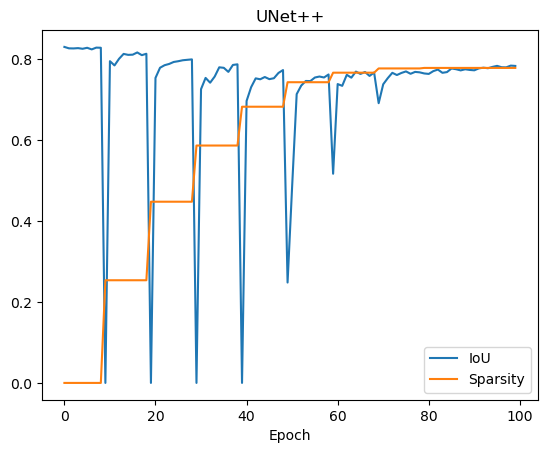

In [108]:
for full_title in full_title_list:
    for sparsity in sparsity_list:
        if sparsity==0:
            continue
        p_df = pruning_progress_df_dict[pruned_title]
        iou_df = p_df[p_df["metric"]=="iou_score"]
        sparsity_df = p_df[p_df["metric"]=="sparsity"]
        title_cmps = full_title.split("_")
        arch = title_cmps[0]
        arch_name = arch_name_dict[arch]
        color = arch_color_dict[arch]
        pruned_title = (full_title+str(sparsity))
        ax = plt.subplot()
#         ax.plot(iou_df["value"].ewm(alpha=0.1).mean(), c=color, linewidth=1)
#         ax.plot(progress_df["value"], alpha=0.5, c=color)
        ax.plot(iou_df["step"], iou_df["value"], label="IoU")
        ax.plot(iou_df["step"], sparsity_df["value"], label="Sparsity")
        plt.title(f"{arch_name}")
        plt.xlabel("Epoch")
        plt.legend()
        plt.gcf()
        plt.savefig(f"{arch}_{str(sparsity)}_training_progress.jpg", dpi=200, bbox_inches='tight')
        plt.show()

In [59]:
# visualize result
import segmentation_models_pytorch as smp
from segmentation_dataset import (SegmentationDataset, get_preprocessing,
                                  get_validation_augmentation)


preprocessing_fn = smp.encoders.get_preprocessing_fn(encoder, "imagenet")
preprocessing = get_preprocessing(preprocessing_fn)
validation_augmentation = get_validation_augmentation()
test_dataset = SegmentationDataset(name="NEA", mode="test", augmentation=validation_augmentation, preprocessing=preprocessing)
test_dataset_raw = SegmentationDataset(name="NEA", mode="test", augmentation=validation_augmentation,)
sample_img, sample_mask = test_dataset.__getitem__(9)
sample_img_raw, sample_mask_raw = test_dataset_raw.__getitem__(9)


In [19]:
from setup import ARCH_CLASS_DICT
def load_model(title, sparsity=0):
    checkpoint_root = "checkpoints"
    checkpoint_dir = pathlib.Path("")/checkpoint_root/title
    checkpoint_dir.mkdir(parents=True, exist_ok=True)
    checkpoint_path = checkpoint_dir/"best_checkpoint.pt"
    title_cmps = title.split("_")
    arch = title_cmps[0]
    encoder = "mobilenet_v2"
    if sparsity>0:
        checkpoint_path = checkpoint_dir/(f"pruned_model-{str(sparsity)}.pth")
        model = torch.load(checkpoint_path.absolute(), map_location=torch.device("cpu"))
    else:
        Arch_Class = ARCH_CLASS_DICT[arch]
        model = Arch_Class(
            encoder_name=encoder,
            encoder_weights="imagenet",
            classes=1,
            activation="sigmoid"
        )
        checkpoint = torch.load(checkpoint_path.absolute(), map_location=torch.device("cpu"))
        model.load_state_dict(checkpoint["model_state_dict"])
    return model

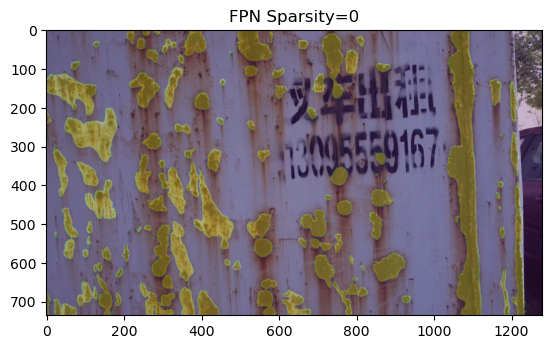

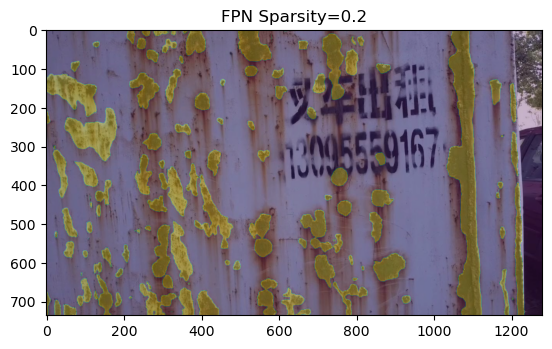

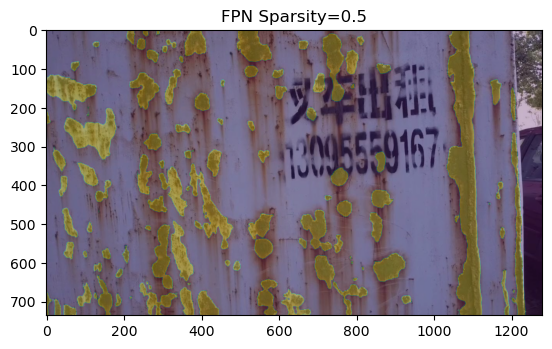

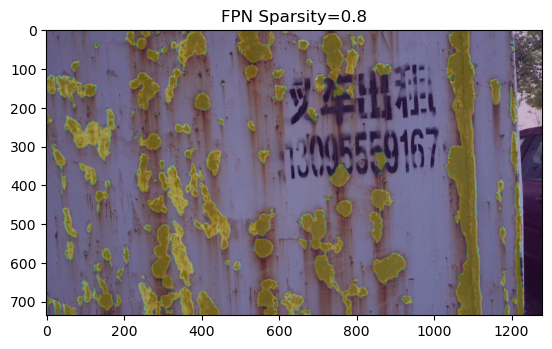

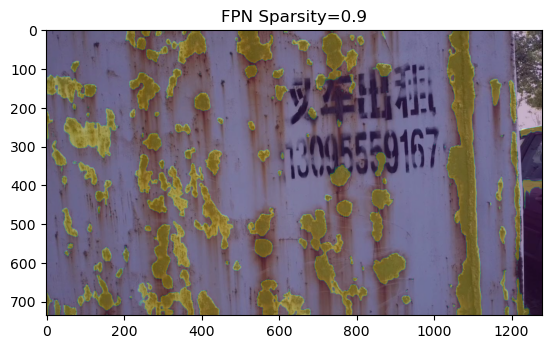

...

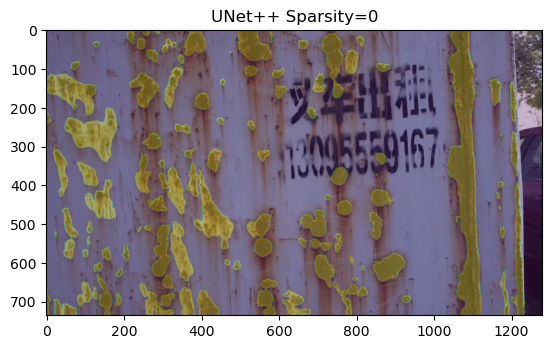

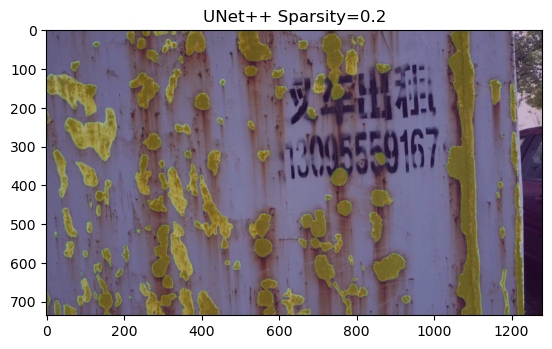

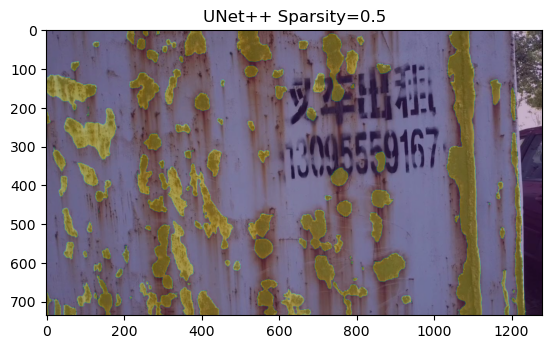

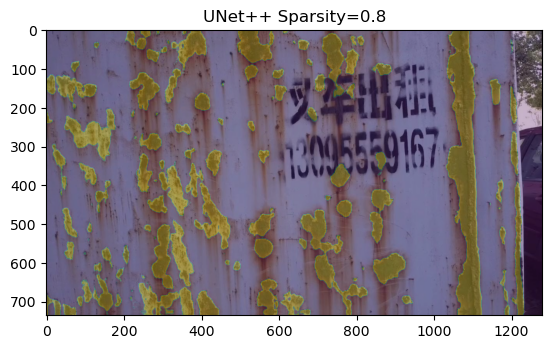

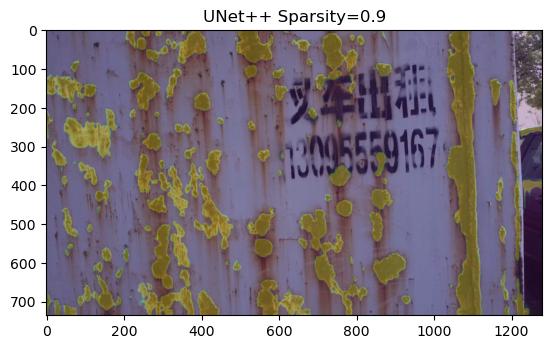

In [104]:
for full_title in full_title_list:
    title_cmps = full_title.split("_")
    arch = title_cmps[0]
    arch_name = arch_name_dict[arch]
    for sparsity in sparsity_list:
        model = load_model(full_title_list[0], sparsity=sparsity)
        # print(sample_img.shape)
        y_pred = model.predict(torch.from_numpy(sample_img[np.newaxis,:,:,:]))
        # print(sample_img.shape)
        x = sample_img_raw
        y_ = y_pred[0,:,:,:].permute(1,2,0)
        # print(x.shape, y_.shape)
        # # print(sample_img[0].shape)
        plt.imshow(x)
        plt.imshow(y_, alpha=0.3)
        plt.title(f"{arch_name} Sparsity={str(sparsity)}")
        plt.gcf()
        plt.savefig(f"figs/{arch}_{str(sparsity)}_training_progress.jpg", dpi=200, bbox_inches='tight')
        plt.show()
#     plt.show()